In [9]:
import os
from PIL import Image, ImageDraw
import numpy as np
import torch
import glob
from pathlib import Path
import random
import matplotlib.pyplot as plt
%autosave 300

Autosaving every 300 seconds


In [88]:
imgs_ext = ['*.png', '*.jpeg', '*.jpg']
txt_ext = ['*.txt']
imgs_dir = os.path.join(os.getcwd(), 'dataset/imgs')
txt_dir = os.path.join(os.getcwd(), 'dataset/txt')
imgs_paths = []
txt_paths = []
os.makedirs(imgs_dir, exist_ok=True)
os.makedirs(txt_dir, exist_ok=True)

In [89]:
for ext in imgs_ext:
    imgs_paths.extend(Path(imgs_dir).glob(ext))

for ext in txt_ext:
    txt_paths.extend(Path(txt_dir).glob(ext))
    
# for txt in txt_paths:
#     os.rename(txt, f"dataset/txt/{str(txt).split('/')[-1]}")

# for img in imgs_paths:
#     os.rename(img, f"dataset/imgs/{str(img).split('/')[-1]}")

In [91]:
def checking_mapping(imgs_paths: list, txt_paths: list):
    """
    Checking if every image have corresponding txt file and vice versa
    """
    assert len(imgs_paths) == len(txt_paths), 'The number of pictures and text files must be the same'
    imgs_files = [str(i).split('/')[-1].split('.')[0] for i in imgs_paths]
    txt_files = [str(i).split('/')[-1].split('.')[0] for i in txt_paths]    
    assert set(imgs_files) - set(txt_files) == set(txt_files) - set(imgs_files), 'Every images must have corresponding txt file'
    
    return imgs_files, txt_files
imgs_files, txt_files = checking_mapping(imgs_paths, txt_paths)

In [80]:
def yolo2pil_coords(x, y, w, h, img_size):
    x0 = x - w/2
    y0 = y - h/2
    
    x1 = x + w/2
    y1 = y + h/2
    
    return (x0*img_size[0], y0*img_size[1], x1*img_size[0], y*img_size[1])

In [118]:
def coords2float(filename: str):
    """
    Transforms coords to float numbers
    """
    float_coords = []
    with open(filename, 'r') as f: coords = f.readlines()
    coords = [i.strip('\n').split(' ')[1:] for i in coords]

    for _ in coords:
        float_coords.append(list(float(x) for x in _))
    return float_coords


[[0.740625, 0.551389, 0.01875, 0.027777999999999997],
 [0.7296879999999999, 0.379861, 0.0125, 0.034722],
 [0.733594, 0.358333, 0.007812, 0.016667],
 [0.730078, 0.386806, 0.019531, 0.076389],
 [0.7398439999999998, 0.575, 0.029687000000000005, 0.083333]]

In [139]:
def expand_coords(pil_coords: list, img_size, sigma=0.05):
    # (1392.0009599999996, 576.0001799999999, 1448.9999999999998, 621.0)
    x_sigma = img_size[0] * sigma 
    y_sigma = img_size[1] * sigma 
    
    x0 = pil_coords[0] - x_sigma
    y0 = pil_coords[1]  - y_sigma
    
    x1 = pil_coords[2] + x_sigma
    y1 = pil_coords[3]  + y_sigma
    
    return [x0, y0, x1, y1]    

In [143]:
im.crop(expand_coords(coords, im.size, sigma=0.05))

TypeError: unsupported operand type(s) for -: 'list' and 'float'

(1392.0009599999996, 576.0001799999999, 1448.9999999999998, 621.0)


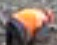

In [127]:
im = Image.open('dataset/imgs/00000002.jpg')

coords = coords2float('dataset/txt/00000002.txt')
coords
# for c in coords:    
coords = yolo2pil_coords(*coords[4], im.size)
print(coords)
# draw = ImageDraw.Draw(im)
draw.rectangle(coords, outline=(255, 0, 0), width=2)
im.crop((coords))
# im.show()

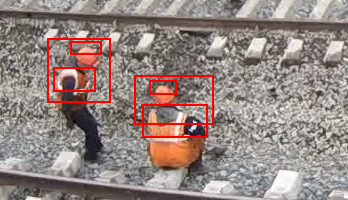

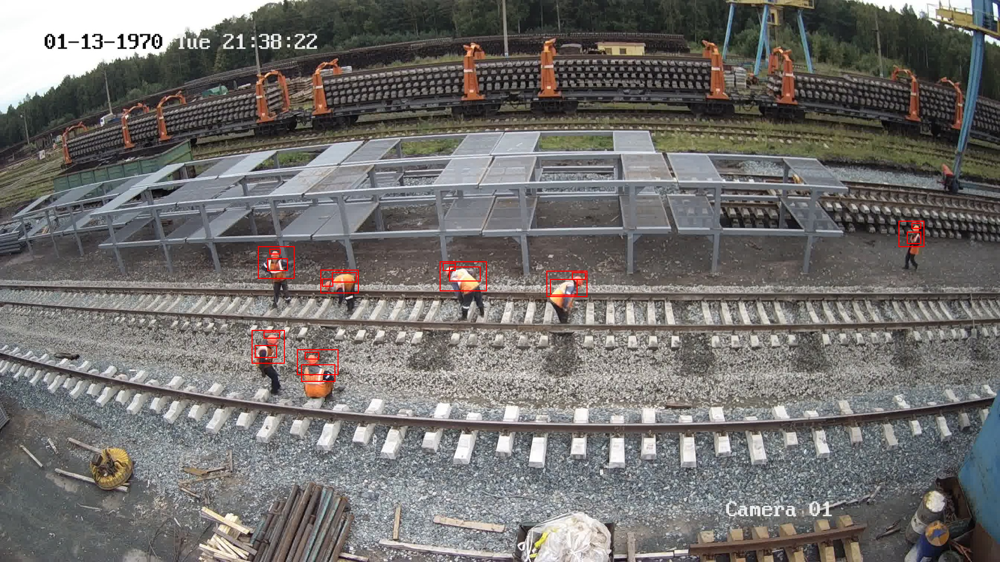

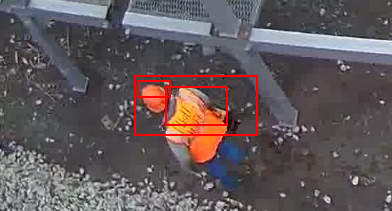

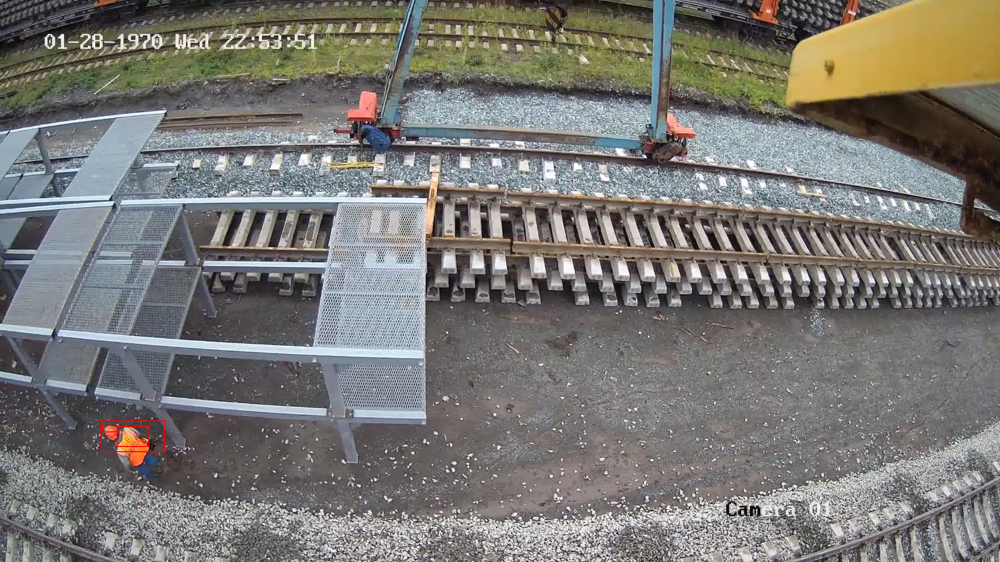

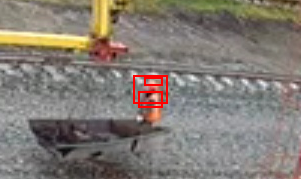

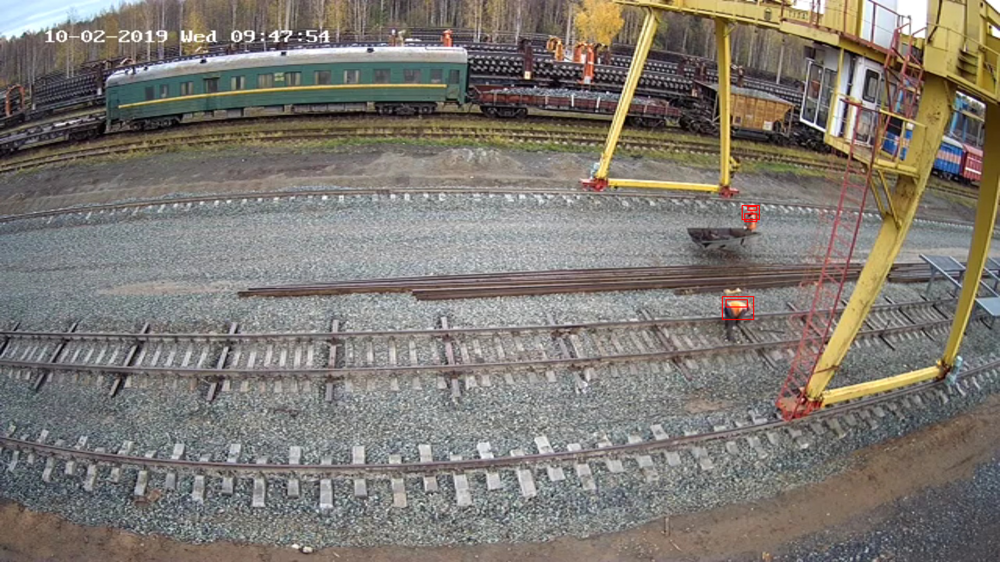

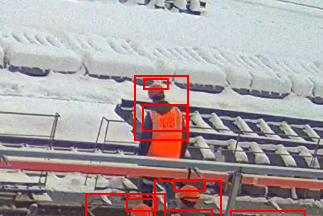

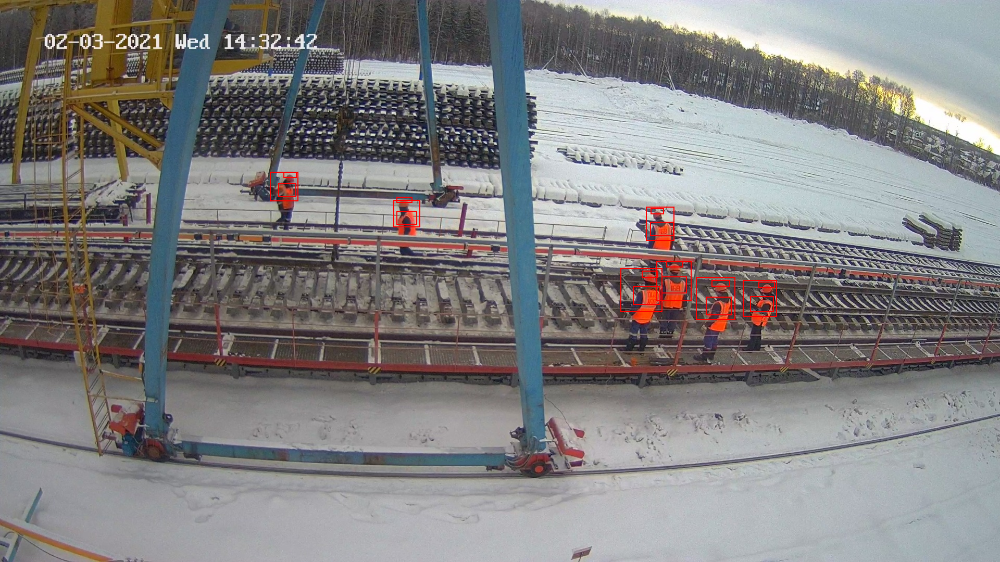

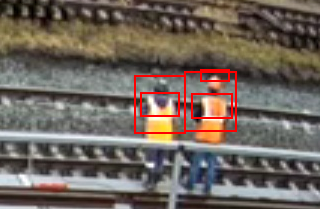

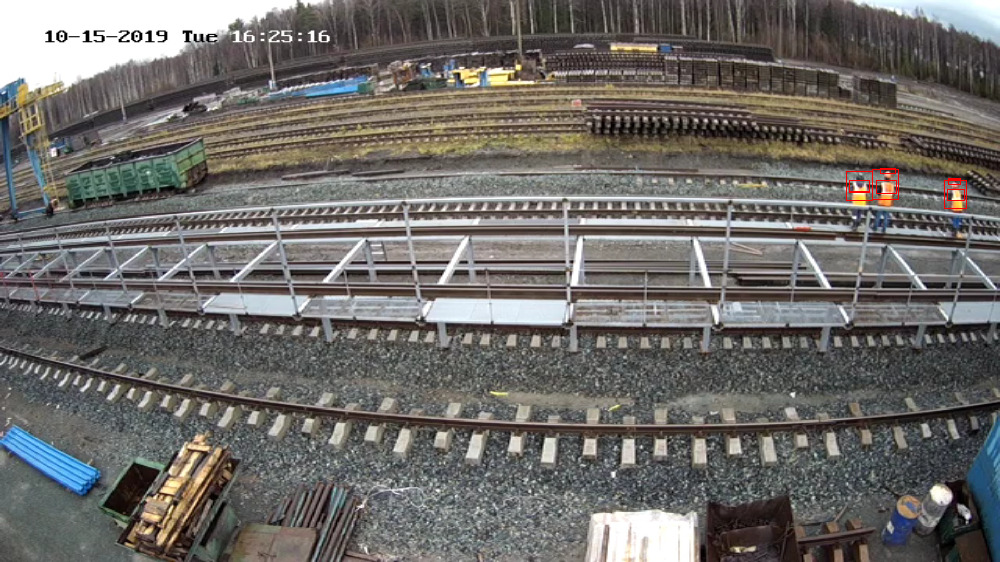

In [155]:
samples = random.choices(imgs_files, k=5)

for indx, sample in enumerate(samples):
    img_path = os.path.join(imgs_dir, '{}.{}'.format(sample, 'jpg'))
    coords_path = os.path.join(txt_dir, '{}.{}'.format(sample, 'txt'))
    im = Image.open(img_path)
    draw = ImageDraw.Draw(im)
    coords = coords2float(coords_path)
    
    cropped_list = []
    for _ in coords:
        c = yolo2pil_coords(*_, im.size)
        draw.rectangle(c, outline=(255, 0, 0), width=2)
        crop = im.crop(expand_coords(c, im.size, sigma=0.07)) 
    crop.show()
    im.show()                               

## As we can see, the goal of our object detection system is to correctly detect workers, their reflective vest and safety helmet


In [109]:
samples

['183', '00000103', '2_781', '555']